**PART1 - HEIGHT DETECTION**

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import cv2.aruco as aruco
import numpy as np

In [ ]:
def detect_markers(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    aruco_dict = aruco.getPredefinedDictionary(aruco.DICT_4X4_100)
    parameters = aruco.DetectorParameters()
    corners, ids, _ = aruco.detectMarkers(
        gray, aruco_dict, parameters=parameters)

    int_corners = np.int0(corners)
    perimeter = cv2.arcLength(corners[0], True)

    return corners, ids, perimeter

In [ ]:
# Load the image
image = cv2.imread("/content/Garvit.jpg")

In [ ]:
# Detect ArUco markers
corners, ids, perimeter = detect_markers(image)

In [ ]:
# Assuming you have detected two markers (head and foot) and want to calculate the distance between them
conversion = 25 / perimeter
if len(corners) == 2:
    head_marker = np.mean(corners[0][0], axis=0).astype(int)
    foot_marker = np.mean(corners[1][0], axis=0).astype(int)

    cv2.line(image, tuple(head_marker), tuple(foot_marker), (0, 255, 0), 2)

    # Calculate distance between head and foot markers
    height = calculate_distance(head_marker, foot_marker) * conversion

    # Format the distance value
    height_text = f"Estimated Height: {height:.2f} cm"

    print("Estimated Height:", height)
    print(height_text)

    # Display the estimated height on the image
    cv2.putText(image, height_text, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

else:
    print("Could not detect two markers (head and foot).")

Estimated Height: 172.10776221081574
Estimated Height: 172.11 cm


In [ ]:
# Display the image with detected markers and lines
aruco.drawDetectedMarkers(image, corners, ids)
cv2_imshow(image)
cv2.imwrite("final_image_with_height.jpg", image)
cv2.waitKey(0)
cv2.destroyAllWindows()

**PART2 - SCALING AND CAMERA CALIBERATION**

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import cv2.aruco as aruco
import numpy as np

def calculate_distance(point1, point2):
    x1, y1 = point1[0], point1[1]
    x2, y2 = point2[0], point2[1]
    distance = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
    return distance

def detect_markers(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    aruco_dict = aruco.getPredefinedDictionary(aruco.DICT_4X4_100)
    parameters = aruco.DetectorParameters()
    corners, ids, _ = aruco.detectMarkers(
        gray, aruco_dict, parameters=parameters)

    int_corners = np.int0(corners)
    perimeter = cv2.arcLength(corners[0], True)

    return corners, ids, perimeter

In [ ]:
def calculate_height_and_distance(image_path, focal_length, sensor_height, head_marker_height):
    image = cv2.imread(image_path)

    corners, ids, perimeter = detect_markers(image)

    if len(corners) == 2:
        head_marker = np.mean(corners[0][0], axis=0).astype(int)
        foot_marker = np.mean(corners[1][0], axis=0).astype(int)

        pixel_height = calculate_distance(head_marker, foot_marker)

        distance = (focal_length * head_marker_height) / (pixel_height * sensor_height)

        height = (head_marker_height * 100) / (pixel_height / perimeter)

        distance_text = f"Estimated Distance: {distance:.2f} units"
        height_text = f"Estimated Height: {height:.2f} cm"

        print("Estimated Distance in pixels :", distance)
        print("Estimated Height Using ArUco markers :", height)

        aruco.drawDetectedMarkers(image, corners, ids)
        cv2_imshow(image)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

    else:
        print("Could not detect two markers (head and foot).")

Estimated Distance in pixels : 0.004324905931822408
Estimated Height Using ArUco markers : 174.30939554749912


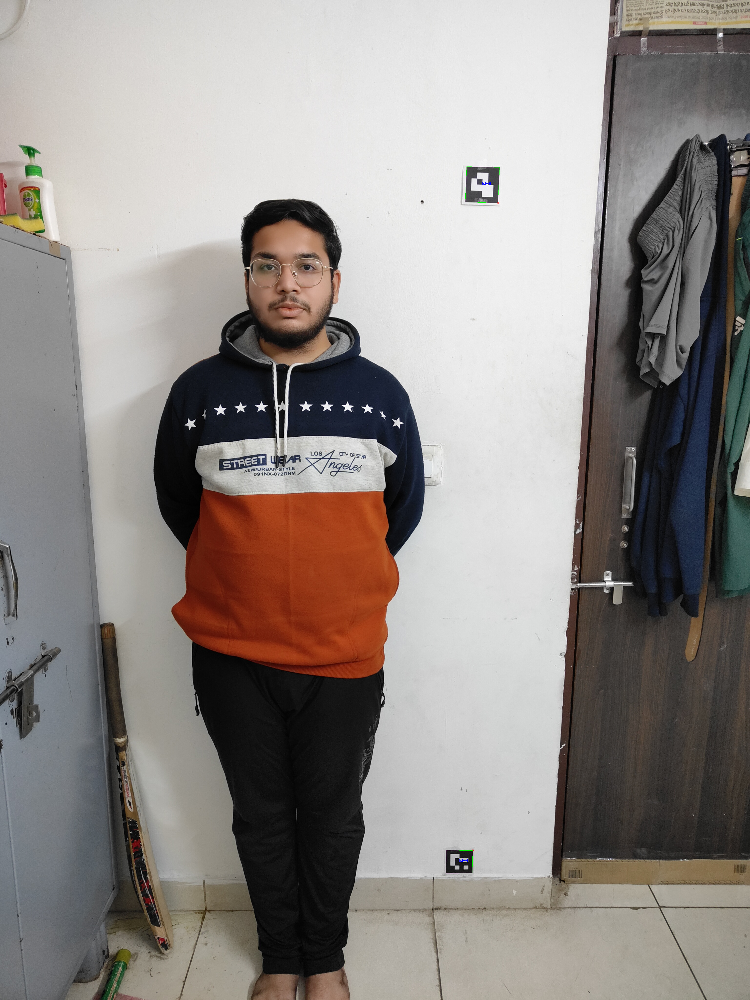

In [ ]:
image_path = "/content/Garvit.jpg"
focal_length = 10  # Focal length of the camera (in pixels)
sensor_height = 10  # Sensor height of the camera (in millimeters)
head_marker_height = 12  # Height of the head marker in real-world units
calculate_height_and_distance(image_path, focal_length, sensor_height, head_marker_height)